In [8]:
import pandas as pd

csv_files = [
    "/application_details_granted_2016.csv",
    "/application_details_granted_2017.csv",
    "/application_details_granted_2018.csv",
    "/application_details_granted_2019.csv",
    "/application_details_granted_2020.csv",
    "/application_details_granted_2021.csv",
    "/application_details_granted_2022.csv",
    "/application_details_granted_2023.csv"
]

df = pd.concat([pd.read_csv(file) for file in csv_files])


In [10]:
df.head()

,PUBLICATION_NUMBER,PUBLICATION_DATE,IPO_LOCATION,APPLICATION_TYPE_DESC,APPLICATION_NUMBER,DATE_OF_FILING,TITLE_OF_INVENTION,FIELD_OF_INVENTION,NO_OF_PAGES,NO_OF_CLAIMS,DATE_UPDATED_d_m_y
0,01/2016,01/01/2016,Delhi,CONVENTION APPLICATION,10/DEL/2010,04/01/2010,"""PRODUCTION OF A PHARMACEUTICAL CONTAINER FROM...",CHEMISTRY,25.0,24.0,19/04/2023
1,01/2016,01/01/2016,Mumbai,PCT NATIONAL PHASE APPLICATION,1005/MUMNP/2007,03/07/2007,“A MANUFACTURING METHOD OF AN ANODE PLATE OF A...,ELECTRICAL,21.0,12.0,19/04/2023
2,01/2016,01/01/2016,Kolkata,CONVENTION APPLICATION,104/KOL/2007,29/01/2007,MOTOR-DRIVEN SURGICAL CUTTING AND FASTENING IN...,BIOMEDICAL,39.0,10.0,19/04/2023
3,01/2016,01/01/2016,Mumbai,PCT NATIONAL PHASE APPLICATION,1045/MUMNP/2009,28/05/2009,SYSTEM AND METHOD FOR DIGITAL SIGNAL PROCESSING,ELECTRONICS,55.0,25.0,19/04/2023
4,01/2016,01/01/2016,Mumbai,PCT NATIONAL PHASE APPLICATION,1070/MUMNP/2009,03/06/2009,“STERILISATION INDICATOR”,PHYSICS,19.0,16.0,19/04/2023


In [11]:
print(df.dtypes)

PUBLICATION_NUMBER        object
PUBLICATION_DATE          object
IPO_LOCATION              object
APPLICATION_TYPE_DESC     object
APPLICATION_NUMBER        object
DATE_OF_FILING            object
TITLE_OF_INVENTION        object
FIELD_OF_INVENTION        object
NO_OF_PAGES              float64
NO_OF_CLAIMS             float64
DATE_UPDATED_d_m_y        object
dtype: object


In [12]:
print(df.isnull().sum())

PUBLICATION_NUMBER         0
PUBLICATION_DATE           0
IPO_LOCATION               0
APPLICATION_TYPE_DESC      0
APPLICATION_NUMBER         0
DATE_OF_FILING             0
TITLE_OF_INVENTION         1
FIELD_OF_INVENTION       225
NO_OF_PAGES              130
NO_OF_CLAIMS             220
DATE_UPDATED_d_m_y         0
dtype: int64


Unique values in each column

In [15]:

for column in df.columns:
  print(f" Unique values in {column} : {df[column].nunique()}")

 Unique values in PUBLICATION_NUMBER : 370
 Unique values in PUBLICATION_DATE : 369
 Unique values in IPO_LOCATION : 4
 Unique values in APPLICATION_TYPE_DESC : 9
 Unique values in APPLICATION_NUMBER : 151439
 Unique values in DATE_OF_FILING : 5699
 Unique values in TITLE_OF_INVENTION : 142371
 Unique values in FIELD_OF_INVENTION : 15
 Unique values in NO_OF_PAGES : 670
 Unique values in NO_OF_CLAIMS : 254
 Unique values in DATE_UPDATED_d_m_y : 1


Count the occurences of each field

In [17]:
field_counts = df["FIELD_OF_INVENTION"].value_counts()
field_counts

CHEMISTRY        38871
MECHANICAL       32828
ELECTRONICS      14591
ELECTRICAL       12199
COMMUNICATION     7972
POLYMER           7853
COMPUTER          7342
PHYSICS           7308
BIOTECHNOLOGY     6016
BIOMEDICAL        5232
METALLURGY        3313
TEXTILE           2369
BIOCHEMISTRY      2055
CIVIL             2017
FOOD              1248
Name: FIELD_OF_INVENTION, dtype: int64

Visulaize the Top N fields

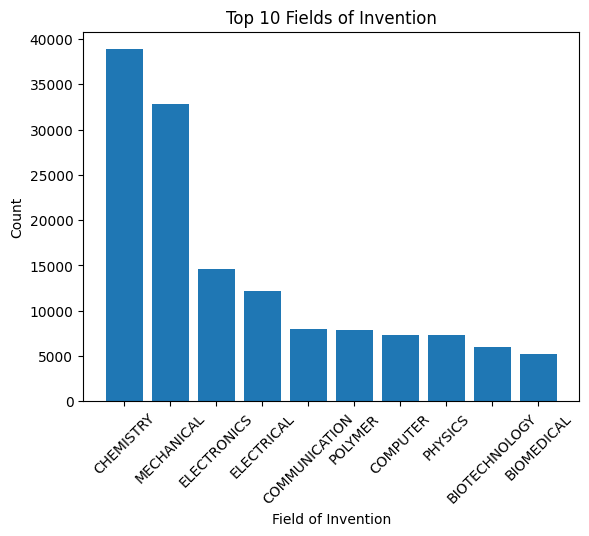

In [27]:
import matplotlib.pyplot as plt

N=10
top_fields = field_counts.head(N)
plt.bar(top_fields.index, top_fields.values)
plt.xticks(rotation=45)
plt.title(f'Top {N} Fields of Invention')
plt.xlabel('Field of Invention')
plt.ylabel('Count')
plt.show()

Most Common Field of Invention

In [28]:
most_common_field = df["FIELD_OF_INVENTION"].value_counts().idxmax()
print(f'The most common field of invention is : {most_common_field}')

The most common field of invention is : CHEMISTRY


Word Frequency Analysis

In [29]:
import seaborn as sns

In [34]:
df["TITLE_OF_INVENTION"] = df["TITLE_OF_INVENTION"].fillna('')
df["TITLE_OF_INVENTION"].head()

0    "PRODUCTION OF A PHARMACEUTICAL CONTAINER FROM...
1    “A MANUFACTURING METHOD OF AN ANODE PLATE OF A...
2    MOTOR-DRIVEN SURGICAL CUTTING AND FASTENING IN...
3      SYSTEM AND METHOD FOR DIGITAL SIGNAL PROCESSING
4                            “STERILISATION INDICATOR”
Name: TITLE_OF_INVENTION, dtype: object

In [38]:
word_counts = df['TITLE_OF_INVENTION'].str.split(expand=True).stack().value_counts()
top_10_words = word_counts.head(10)

Word Frequency Plot

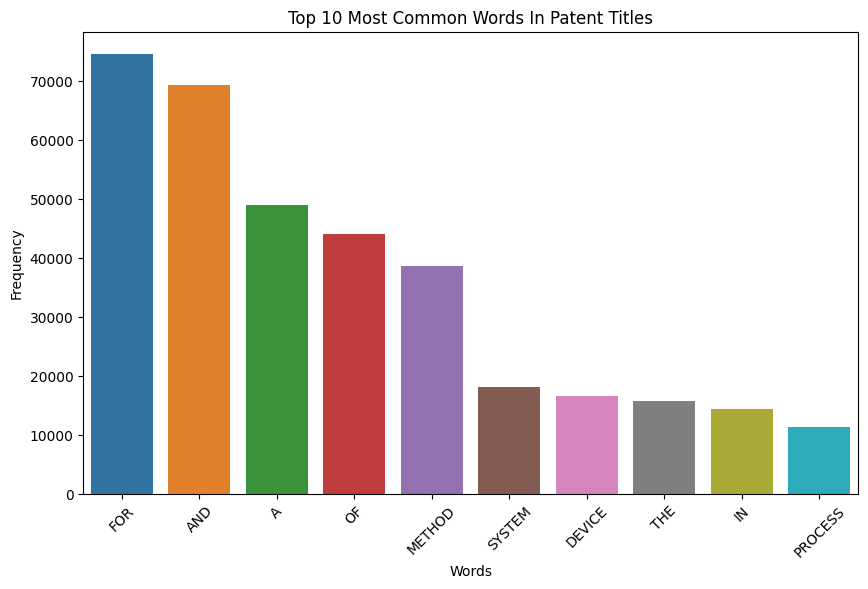

In [44]:
plt.figure(figsize=(10,6))
sns.barplot(x = top_10_words.index, y = top_10_words.values)
plt.xticks(rotation=45)
plt.title("Top 10 Most Common Words In Patent Titles")
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.show()

Word Cloud Visualization

In [46]:
from wordcloud import WordCloud

In [47]:
df['TITLE_OF_INVENTION'] = df['TITLE_OF_INVENTION'].fillna('')

In [49]:
text = ' '.join(df['TITLE_OF_INVENTION'].values)
text

'"PRODUCTION OF A PHARMACEUTICAL CONTAINER FROM THE MELT" “A MANUFACTURING METHOD OF AN ANODE PLATE OF A LITHIUM-ION BATTERY” MOTOR-DRIVEN SURGICAL CUTTING AND FASTENING INSTRUMENT WITH ARTICULATABLE END EFFECTOR SYSTEM AND METHOD FOR DIGITAL SIGNAL PROCESSING “STERILISATION INDICATOR” "A HOMEOPATHIC COMPOSITION TO BE USED AS A SUBSTITUTE FOR CHEMICAL PESTICIDE ESPECIALLY USEFUL IN  RAMBLING VINE AND CREEPING VEGETABLE PLANTS" "A HOMEOPATHIC COMPOSITION TO BE USED AS A SUBSTITUTE OF CHEMICAL NITROGENOUS FERTILIZERS" "A HOMEOPATHIC COMPOSITION TO BE USED AS A SUBSTITUTE FOR CHEMICAL PESTICIDE ESPECIALLY USEFUL IN  A POTATO CULTIVATION" "A HOMEOPATHIC COMPOSITION TO BE USED AS PESTICIDE" "A PROCESS TO PRODUCE AN ENRICHMENT FEED" "A MULTILAYER FILM" AUTO HAZARD SYSTEM - VEHICLE "XYLITOL SYNTHESIS MUTANT OF XYLOSE-UTILIZING ZYMOMONAS FOR ETHANOL PRODUCTION" "A SUBSTITUTED ECTEINASCIDIN COMPOUND" ELECTRODES USEFUL FOR MOLTEN SALT ELECTROLYSIS OF ALUMINUM OXIDE TO ALUMINUM MUFF COUPLING ASSE

In [55]:
wc = WordCloud(width=800, height=400, background_color = 'white').generate(text)

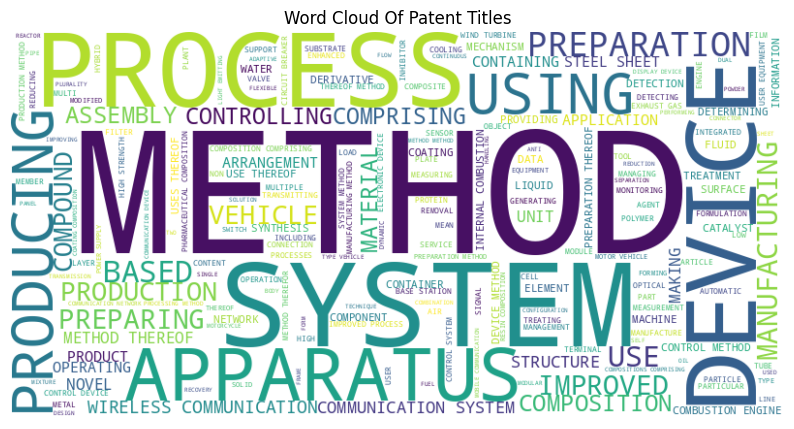

In [60]:
plt.figure(figsize=(10,6))
plt.imshow(wc, interpolation = "bilinear")
plt.title('Word Cloud Of Patent Titles')
plt.axis('off')
plt.show()